# Introduction

In this project, I tried to predict different cancers based on the gene expression data.

I downloaded gene expression data of ten different kinds of cancers from the TCGA database. 

Firstly, I prepared the data by selecting the first 100 patients as a training dataset and 20 patients (101-120 patients) as a testing dataset. 

Then, I fit the training data with different machine learning models.

Finally, I achieved 95% accuracy with the Random Forest model, which is a pretty good accuracy in the in vitro diagnostics field.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.metrics import accuracy_score
warnings.filterwarnings('ignore')
pd.set_option('max_columns', 1000)
pd.set_option('max_row', 400)

# Load data

In [3]:
df_raw = pd.read_csv('Cancer_train.csv', index_col='Entrez_Gene_Id')

In [3]:
df_raw.head()

,Hugo_Symbol,TCGA-2F-A9KO-01,TCGA-2F-A9KP-01,TCGA-2F-A9KQ-01,TCGA-2F-A9KR-01,TCGA-2F-A9KT-01,TCGA-2F-A9KW-01,TCGA-4Z-AA7M-01,TCGA-4Z-AA7N-01,TCGA-4Z-AA7O-01,TCGA-4Z-AA7Q-01,TCGA-4Z-AA7R-01,TCGA-4Z-AA7S-01,TCGA-4Z-AA7W-01,TCGA-4Z-AA7Y-01,TCGA-4Z-AA80-01,TCGA-4Z-AA81-01,TCGA-4Z-AA82-01,TCGA-4Z-AA83-01,TCGA-4Z-AA84-01,TCGA-4Z-AA86-01,TCGA-4Z-AA87-01,TCGA-4Z-AA89-01,TCGA-5N-A9KI-01,TCGA-5N-A9KM-01,TCGA-BL-A0C8-01,TCGA-BL-A13I-01,TCGA-BL-A13J-01,TCGA-BL-A3JM-01,TCGA-BL-A5ZZ-01,TCGA-BT-A0S7-01,TCGA-BT-A0YX-01,TCGA-BT-A20J-01,TCGA-BT-A20N-01,TCGA-BT-A20O-01,TCGA-BT-A20P-01,TCGA-BT-A20Q-01,TCGA-BT-A20R-01,TCGA-BT-A20T-01,TCGA-BT-A20U-01,TCGA-BT-A20V-01,TCGA-BT-A20W-01,TCGA-BT-A20X-01,TCGA-BT-A2LA-01,TCGA-BT-A2LB-01,TCGA-BT-A2LD-01,TCGA-BT-A3PH-01,TCGA-BT-A3PJ-01,TCGA-BT-A3PK-01,TCGA-BT-A42C-01,TCGA-BT-A42E-01,TCGA-BT-A42F-01,TCGA-C4-A0EZ-01,TCGA-C4-A0F0-01,TCGA-C4-A0F1-01,TCGA-C4-A0F6-01,TCGA-C4-A0F7-01,TCGA-CF-A1HR-01,TCGA-CF-A1HS-01,TCGA-CF-A27C-01,TCGA-CF-A3MF-01,TCGA-CF-A3MG-01,TCGA-CF-A3MH-01,TCGA-CF-A3MI-01,TCGA-CF-A47S-01,TCGA-CF-A47T-01,TCGA-CF-A47V-01,TCGA-CF-A47W-01,TCGA-CF-A47X-01,TCGA-CF-A47Y-01,TCGA-CF-A5U8-01,TCGA-CF-A5UA-01,TCGA-CF-A7I0-01,TCGA-CF-A8HX-01,TCGA-CF-A8HY-01,TCGA-CF-A9FF-01,TCGA-CF-A9FH-01,TCGA-CF-A9FL-01,TCGA-CF-A9FM-01,TCGA-CU-A0YN-01,TCGA-CU-A0YO-01,TCGA-CU-A0YR-01,TCGA-CU-A3KJ-01,TCGA-CU-A3QU-01,TCGA-CU-A3YL-01,TCGA-CU-A5W6-01,TCGA-CU-A72E-01,TCGA-DK-A1A3-01,TCGA-DK-A1A5-01,TCGA-DK-A1A6-01,TCGA-DK-A1A7-01,TCGA-DK-A1AA-01,TCGA-DK-A1AB-01,TCGA-DK-A1AC-01,TCGA-DK-A1AD-01,TCGA-DK-A1AE-01,TCGA-DK-A1AF-01,TCGA-DK-A1AG-01,TCGA-DK-A2HX-01,TCGA-DK-A2I1-01,TCGA-CS-4941-01,TCGA-CS-4942-01,TCGA-CS-4943-01,TCGA-CS-4944-01,TCGA-CS-5390-01,TCGA-CS-5393-01,TCGA-CS-5394-01,TCGA-CS-5395-01,TCGA-CS-5396-01,TCGA-CS-5397-01,TCGA-CS-6186-01,TCGA-CS-6188-01,TCGA-CS-6290-01,TCGA-CS-6665-01,TCGA-CS-6666-01,TCGA-CS-6667-01,TCGA-CS-6668-01,TCGA-CS-6669-01,TCGA-CS-6670-01,TCGA-DB-5270-01,TCGA-DB-5273-01,TCGA-DB-5274-01,TCGA-DB-5275-01,TCGA-DB-5276-01,TCGA-DB-5277-01,TCGA-DB-5278-01,TCGA-DB-5279-01,TCGA-DB-5280-01,TCGA-DB-5281-01,TCGA-DB-A4X9-01,TCGA-DB-A4XA-01,TCGA-DB-A4XB-01,TCGA-DB-A4XC-01,TCGA-DB-A4XD-01,TCGA-DB-A4XE-01,TCGA-DB-A4XF-01,TCGA-DB-A4XG-01,TCGA-DB-A4XH-01,TCGA-DB-A64L-01,TCGA-DB-A64O-01,TCGA-DB-A64P-01,TCGA-DB-A64Q-01,TCGA-DB-A64R-01,TCGA-DB-A64S-01,TCGA-DB-A64U-01,TCGA-DB-A64V-01,TCGA-DB-A64W-01,TCGA-DB-A64X-01,TCGA-DB-A75K-01,TCGA-DB-A75L-01,TCGA-DB-A75M-01,TCGA-DB-A75O-01,TCGA-DB-A75P-01,TCGA-DH-5140-01,TCGA-DH-5141-01,TCGA-DH-5142-01,TCGA-DH-5143-01,TCGA-DH-5144-01,TCGA-DH-A669-01,TCGA-DH-A66B-01,TCGA-DH-A66D-01,TCGA-DH-A66F-01,TCGA-DH-A66G-01,TCGA-DH-A7UR-01,TCGA-DH-A7US-01,TCGA-DH-A7UT-01,TCGA-DH-A7UU-01,TCGA-DH-A7UV-01,TCGA-DU-5847-01,TCGA-DU-5849-01,TCGA-DU-5851-01,TCGA-DU-5852-01,TCGA-DU-5853-01,TCGA-DU-5854-01,TCGA-DU-5855-01,TCGA-DU-5870-01,TCGA-DU-5871-01,TCGA-DU-5872-01,TCGA-DU-5874-01,TCGA-DU-6392-01,TCGA-DU-6393-01,TCGA-DU-6394-01,TCGA-DU-6395-01,TCGA-DU-6396-01,TCGA-DU-6397-01,TCGA-DU-6399-01,TCGA-DU-6400-01,TCGA-DU-6401-01,TCGA-DU-6402-01,TCGA-DU-6403-01,TCGA-DU-6404-01,TCGA-DU-6405-01,TCGA-DU-6406-01,TCGA-DU-6407-01,TCGA-DU-6408-01,TCGA-DU-6410-01,TCGA-DU-6542-01,TCGA-DU-7006-01,TCGA-DU-7007-01,TCGA-3C-AALI-01,TCGA-3C-AALJ-01,TCGA-3C-AALK-01,TCGA-4H-AAAK-01,TCGA-5L-AAT0-01,TCGA-5T-A9QA-01,TCGA-A1-A0SB-01,TCGA-A1-A0SD-01,TCGA-A1-A0SE-01,TCGA-A1-A0SF-01,TCGA-A1-A0SG-01,TCGA-A1-A0SH-01,TCGA-A1-A0SI-01,TCGA-A1-A0SJ-01,TCGA-A1-A0SK-01,TCGA-A1-A0SM-01,TCGA-A1-A0SN-01,TCGA-A1-A0SO-01,TCGA-A1-A0SP-01,TCGA-A1-A0SQ-01,TCGA-A2-A04N-01,TCGA-A2-A04P-01,TCGA-A2-A04Q-01,TCGA-A2-A04R-01,TCGA-A2-A04T-01,TCGA-A2-A04U-01,TCGA-A2-A04V-01,TCGA-A2-A04W-01,TCGA-A2-A04X-01,TCGA-A2-A04Y-01,TCGA-A2-A0CK-01,TCGA-A2-A0CL-01,TCGA-A2-A0CM-01,TCGA-A2-A0CO-01,TCGA-A2-A0CP-01,TCGA-A2-A0CQ-01,TCGA-A2-A0CR-01,TCGA-A2-A0CS-01,TCGA-A2-A0CT-01,TCGA-A2-A0CU-01,TCGA-A2-A0CV-01,TCGA-A2-A0CW-01,TCGA-A2-A0CX-01,TCGA-A2-A0CZ-01,TCGA-A2-A0D0-01,TCGA-A2-A0D1-01,TCGA-A2-A0D2-01,TCGA-A2-A0D3-01,TCGA-A2-A0D4-01,TCGA-A2-A0EM-01,TCGA-A2-A0EN-01,TCG

In [4]:
df_raw.shape

(20532, 991)

In [5]:
df = df_raw.transpose()

In [6]:
df.shape

(991, 20532)

In [7]:
df.head()

Entrez_Gene_Id,NaN,100130426.0,100133144.0,100134869.0,10357.0,10431.0,136542.0,155060.0,26823.0,280660.0,317712.0,340602.0,388795.0,390284.0,391343.0,391714.0,404770.0,441362.0,442388.0,553137.0,57714.0,645851.0,652919.0,653553.0,728045.0,728603.0,728788.0,729884.0,8225.0,90288.0,1.0,29974.0,54715.0,87769.0,2.0,144568.0,53947.0,51146.0,404744.0,8086.0,65985.0,729522.0,13.0,344752.0,126767.0,343066.0,51166.0,79719.0,22848.0,14.0,15.0,16.0,57505.0,80755.0,132949.0,60496.0,10157.0,26574.0,9625.0,18.0,10349.0,19.0,79963.0,26154.0,154664.0,650655.0,20.0,21.0,24.0,23461.0,23460.0,10347.0,10351.0,10350.0,23456.0,8647.0,5243.0,5244.0,340273.0,10058.0,22.0,11194.0,23457.0,89845.0,85320.0,94160.0,150000.0,4363.0,1244.0,8714.0,10257.0,10057.0,368.0,653190.0,730013.0,6833.0,10060.0,215.0,225.0,5825.0,5826.0,6059.0,23.0,10061.0,55324.0,9619.0,9429.0,64137.0,64240.0,64241.0,55347.0,83451.0,26090.0,145447.0,84945.0,25864.0,84836.0,116236.0,84696.0,11057.0,171586.0,63874.0,51099.0,57406.0,79575.0,10006.0,10152.0,51225.0,25890.0,25.0,27.0,3983.0,84448.0,22885.0,28.0,26.0,29.0,137735.0,29777.0,80325.0,25841.0,30.0,10449.0,31.0,32.0,80724.0,84129.0,27034.0,28976.0,33.0,34.0,35.0,36.0,37.0,176.0,9744.0,23527.0,116983.0,38.0,39.0,64746.0,79777.0,91452.0,84320.0,414149.0,40.0,41.0,9311.0,55515.0,51802.0,84680.0,390110.0,65057.0,1636.0,59272.0,125981.0,340485.0,55331.0,43.0,22985.0,47.0,130013.0,57001.0,48.0,50.0,26027.0,134526.0,55856.0,641371.0,10965.0,122970.0,641372.0,11332.0,10005.0,23597.0,51.0,8309.0,8310.0,55289.0,52.0,53.0,54.0,51205.0,92370.0,55.0,93650.0,49.0,84519.0,93953.0,56.0,23205.0,81616.0,80221.0,197322.0,2180.0,2181.0,2182.0,51703.0,23305.0,116285.0,123876.0,348158.0,6296.0,341392.0,54988.0,84532.0,55902.0,79611.0,58.0,59.0,60.0,345651.0,70.0,71.0,72.0,86.0,51412.0,10881.0,10880.0,81569.0,284382.0,87.0,88.0,89.0,81.0,55860.0,10121.0,10120.0,10097.0,10096.0,57180.0,653857.0,79913.0,64431.0,93973.0,139741.0,140625.0,90.0,91.0,130399.0,92.0,93.0,94.0,95.0,91703.0,97.0,98.0,100.0,132612.0,161931.0,161823.0,102.0,4185.0,8038.0,8751.0,6868.0,8749.0,8728.0,8748.0,8747.0,145241.0,2515.0,53616.0,8745.0,10863.0,11086.0,11085.0,203102.0,80332.0,1587.0,255926.0,8755.0,8756.0,101.0,8754.0,27299.0,81794.0,81792.0,11093.0,140766.0,170689.0,170690.0,170691.0,170692.0,171019.0,9510.0,80070.0,9509.0,9508.0,9507.0,11096.0,11174.0,11173.0,11095.0,56999.0,92949.0,9719.0,57188.0,54507.0,339366.0,11033.0,55803.0,103.0,104.0,105.0,23536.0,134637.0,113179.0,113451.0,57143.0,90956.0,79934.0,203054.0,55811.0,107.0,108.0,109.0,196883.0,111.0,112.0,113.0,114.0,115.0,116.0,117.0,118.0,119.0,120.0,124.0,125.0,126.0,127.0,128.0,130.0,131.0,137872.0,55256.0,149685.0,9370.0,51094.0,79602.0,132.0,133.0,79924.0,22850.0,23394.0,84890.0,134.0,135.0,136.0,140.0,83440.0,141.0,113622.0,54936.0,148.0,147.0,146.0,150.0,151.0,152.0,153.0,154.0,155.0,156.0,157.0,11047.0,158.0,159.0,122622.0,165.0,121536.0,64782.0,166.0,60312.0,134265.0,84632.0,246182.0,4299.0,2334.0,3899.0,27125.0,172.0,10939.0,173.0,125061.0,174.0,54812.0,387763.0,175.0,119385.0,116987.0,116986.0,116988.0,119016.0,729092.0,414189.0,653268.0,728404.0,123624.0,79841.0,340351.0,84871.0,60509.0,177.0,3267.0,3268.0,55109.0,55750.0,178.0,79814.0,10554.0,10555.0,56894.0,56895.0,55326.0,137964.0,84803.0,123688.0,8540.0,10551.0,155465.0,375790.0,181.0,183.0,23287.0,185.0,186.0,57085.0,189.0,64902.0,64850.0,85007.0,25909.0,191.0,10768.0,23382.0,27245.0,54806.0,113146.0,79026.0,196.0,57491.0,10598.0,130872.0,197.0,51327.0,57379.0,64853.0,199.0,83543.0,9131.0,84883.0,150209.0,51390.0,202.0,55057.0,9447.0,9255.0,7965.0,9049.0,23746.0,326.0,55966.0,203.0,204.0,50808.0,205.0,26289.0,122481.0,11216.0,11215.0,9590.0,11214.0,158798.0,8165.0,11217.0,10566.0,8852.0,9495.0,...,353355.0,10780.0,9310.0,7776.0,7571.0,10472.0,8187.0,7572.0,57209.0,58500.0,90987.0,219749.0,286101.0,56242.0,9534.0,10172.0,113835.0,8882.0,339324.0,10127.0,9422.0,10781.0,10308.0,7574.0,10795.0,10778.0,10793.0,10782.0,10838.0,7549.0,92822.0,11179.0,129

In [8]:
df.columns = df.columns.fillna('Disease')

In [9]:
df.Disease.value_counts()

Liver_cancer            99
Breast_cancer           99
head_and_neck_cancer    99
Glioblastoma            99
Stomach_ad              99
Brain_cancer            99
Kidney cancer           99
Bladder_cancer          99
Lung_sc                 99
Lung_ad                 99
Name: Disease, dtype: int64

In [10]:
df.drop('Hugo_Symbol', inplace = True)

In [11]:
df.head()

Entrez_Gene_Id,Disease,100130426.0,100133144.0,100134869.0,10357.0,10431.0,136542.0,155060.0,26823.0,280660.0,317712.0,340602.0,388795.0,390284.0,391343.0,391714.0,404770.0,441362.0,442388.0,553137.0,57714.0,645851.0,652919.0,653553.0,728045.0,728603.0,728788.0,729884.0,8225.0,90288.0,1.0,29974.0,54715.0,87769.0,2.0,144568.0,53947.0,51146.0,404744.0,8086.0,65985.0,729522.0,13.0,344752.0,126767.0,343066.0,51166.0,79719.0,22848.0,14.0,15.0,16.0,57505.0,80755.0,132949.0,60496.0,10157.0,26574.0,9625.0,18.0,10349.0,19.0,79963.0,26154.0,154664.0,650655.0,20.0,21.0,24.0,23461.0,23460.0,10347.0,10351.0,10350.0,23456.0,8647.0,5243.0,5244.0,340273.0,10058.0,22.0,11194.0,23457.0,89845.0,85320.0,94160.0,150000.0,4363.0,1244.0,8714.0,10257.0,10057.0,368.0,653190.0,730013.0,6833.0,10060.0,215.0,225.0,5825.0,5826.0,6059.0,23.0,10061.0,55324.0,9619.0,9429.0,64137.0,64240.0,64241.0,55347.0,83451.0,26090.0,145447.0,84945.0,25864.0,84836.0,116236.0,84696.0,11057.0,171586.0,63874.0,51099.0,57406.0,79575.0,10006.0,10152.0,51225.0,25890.0,25.0,27.0,3983.0,84448.0,22885.0,28.0,26.0,29.0,137735.0,29777.0,80325.0,25841.0,30.0,10449.0,31.0,32.0,80724.0,84129.0,27034.0,28976.0,33.0,34.0,35.0,36.0,37.0,176.0,9744.0,23527.0,116983.0,38.0,39.0,64746.0,79777.0,91452.0,84320.0,414149.0,40.0,41.0,9311.0,55515.0,51802.0,84680.0,390110.0,65057.0,1636.0,59272.0,125981.0,340485.0,55331.0,43.0,22985.0,47.0,130013.0,57001.0,48.0,50.0,26027.0,134526.0,55856.0,641371.0,10965.0,122970.0,641372.0,11332.0,10005.0,23597.0,51.0,8309.0,8310.0,55289.0,52.0,53.0,54.0,51205.0,92370.0,55.0,93650.0,49.0,84519.0,93953.0,56.0,23205.0,81616.0,80221.0,197322.0,2180.0,2181.0,2182.0,51703.0,23305.0,116285.0,123876.0,348158.0,6296.0,341392.0,54988.0,84532.0,55902.0,79611.0,58.0,59.0,60.0,345651.0,70.0,71.0,72.0,86.0,51412.0,10881.0,10880.0,81569.0,284382.0,87.0,88.0,89.0,81.0,55860.0,10121.0,10120.0,10097.0,10096.0,57180.0,653857.0,79913.0,64431.0,93973.0,139741.0,140625.0,90.0,91.0,130399.0,92.0,93.0,94.0,95.0,91703.0,97.0,98.0,100.0,132612.0,161931.0,161823.0,102.0,4185.0,8038.0,8751.0,6868.0,8749.0,8728.0,8748.0,8747.0,145241.0,2515.0,53616.0,8745.0,10863.0,11086.0,11085.0,203102.0,80332.0,1587.0,255926.0,8755.0,8756.0,101.0,8754.0,27299.0,81794.0,81792.0,11093.0,140766.0,170689.0,170690.0,170691.0,170692.0,171019.0,9510.0,80070.0,9509.0,9508.0,9507.0,11096.0,11174.0,11173.0,11095.0,56999.0,92949.0,9719.0,57188.0,54507.0,339366.0,11033.0,55803.0,103.0,104.0,105.0,23536.0,134637.0,113179.0,113451.0,57143.0,90956.0,79934.0,203054.0,55811.0,107.0,108.0,109.0,196883.0,111.0,112.0,113.0,114.0,115.0,116.0,117.0,118.0,119.0,120.0,124.0,125.0,126.0,127.0,128.0,130.0,131.0,137872.0,55256.0,149685.0,9370.0,51094.0,79602.0,132.0,133.0,79924.0,22850.0,23394.0,84890.0,134.0,135.0,136.0,140.0,83440.0,141.0,113622.0,54936.0,148.0,147.0,146.0,150.0,151.0,152.0,153.0,154.0,155.0,156.0,157.0,11047.0,158.0,159.0,122622.0,165.0,121536.0,64782.0,166.0,60312.0,134265.0,84632.0,246182.0,4299.0,2334.0,3899.0,27125.0,172.0,10939.0,173.0,125061.0,174.0,54812.0,387763.0,175.0,119385.0,116987.0,116986.0,116988.0,119016.0,729092.0,414189.0,653268.0,728404.0,123624.0,79841.0,340351.0,84871.0,60509.0,177.0,3267.0,3268.0,55109.0,55750.0,178.0,79814.0,10554.0,10555.0,56894.0,56895.0,55326.0,137964.0,84803.0,123688.0,8540.0,10551.0,155465.0,375790.0,181.0,183.0,23287.0,185.0,186.0,57085.0,189.0,64902.0,64850.0,85007.0,25909.0,191.0,10768.0,23382.0,27245.0,54806.0,113146.0,79026.0,196.0,57491.0,10598.0,130872.0,197.0,51327.0,57379.0,64853.0,199.0,83543.0,9131.0,84883.0,150209.0,51390.0,202.0,55057.0,9447.0,9255.0,7965.0,9049.0,23746.0,326.0,55966.0,203.0,204.0,50808.0,205.0,26289.0,122481.0,11216.0,11215.0,9590.0,11214.0,158798.0,8165.0,11217.0,10566.0,8852.0,9495.0,...,353355.0,10780.0,9310.0,7776.0,7571.0,10472.0,8187.0,7572.0,57209.0,58500.0,90987.0,219749.0,286101.0,56242.0,9534.0,10172.0,113835.0,8882.0,339324.0,10127.0,9422.0,10781.0,10308.0,7574.0,10795.0,10778.0,10793.0,10782.0,10838.0,7549.0,92822.0,11179.0

# encoding categorical data

In [12]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [13]:
df.iloc[:, 0] = le.fit_transform(df.iloc[:, 0].values)

In [14]:
print(df.iloc[:, 0])

TCGA-2F-A9KO-01    0
TCGA-2F-A9KP-01    0
TCGA-2F-A9KQ-01    0
TCGA-2F-A9KR-01    0
TCGA-2F-A9KT-01    0
                  ..
TCGA-BR-8690-01    8
TCGA-BR-A44T-01    8
TCGA-BR-A44U-01    8
TCGA-BR-A452-01    8
TCGA-BR-A453-01    8
Name: Disease, Length: 990, dtype: int32


In [15]:
result = list(le.inverse_transform([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, ]))
result

['Bladder_cancer',
 'Brain_cancer',
 'Breast_cancer',
 'Glioblastoma',
 'Kidney cancer',
 'Liver_cancer',
 'Lung_ad',
 'Lung_sc',
 'Stomach_ad',
 'head_and_neck_cancer']

In [16]:
encoding_result = pd.DataFrame({'Code':[0, 1, 2, 3, 4, 5, 6, 7, 8, 9], 'Disease':['Bladder_cancer',
 'Brain_cancer',
 'Breast_cancer',
 'Glioblastoma',
 'Kidney cancer',
 'Liver_cancer',
 'Lung_ad',
 'Lung_sc',
 'Stomach_ad',
 'head_and_neck_cancer']})
encoding_result

,Code,Disease
0,0,Bladder_cancer
1,1,Brain_cancer
2,2,Breast_cancer
3,3,Glioblastoma
4,4,Kidney cancer
5,5,Liver_cancer
6,6,Lung_ad
7,7,Lung_sc
8,8,Stomach_ad
9,9,head_and_neck_cancer


In [17]:
df.dtypes

Entrez_Gene_Id
Disease         int32
100130426.0    object
100133144.0    object
100134869.0    object
10357.0        object
                ...  
440590.0       object
79699.0        object
7791.0         object
23140.0        object
26009.0        object
Length: 20532, dtype: object

In [18]:
df.iloc[:, 0].value_counts()

9    99
8    99
7    99
6    99
5    99
4    99
3    99
2    99
1    99
0    99
Name: Disease, dtype: int64

# Visualiazation

In [19]:
Bladder_cancer = df[df.Disease==0]
Brain_cancer = df[df.Disease==1]   
Breast_cancer = df[df.Disease==2]   
Glioblastoma = df[df.Disease==3]
Kidney_cancer = df[df.Disease==4]
Liver_cancer = df[df.Disease==5]
Lung_ad = df[df.Disease==6]
Lung_sc = df[df.Disease==7]
Stomach_ad = df[df.Disease==8]
head_and_neck_cancer = df[df.Disease==9]

([<matplotlib.patches.Wedge at 0x273ad684f60>,
 [Text(1.0461621663333946, 0.3399186987098808, 'Bladder_cancer'),
  Text(0.6465637650236903, 0.8899187028927925, 'Brain_cancer'),
  Text(-2.5747358111484753e-08, 1.0999999999999999, 'Breast_cancer'),
  Text(-0.6465638066837905, 0.8899186726249574, 'Glioblastoma'),
  Text(-1.0461621822461362, 0.3399186497354952, 'Kidney cancer'),
  Text(-1.0461621504206509, -0.33991874768426583, 'Liver_cancer'),
  Text(-0.6465637233635886, -0.8899187331606258, 'Lung_ad'),
  Text(7.724207457870327e-08, -1.0999999999999974, 'Lung_sc'),
  Text(0.6465638483438898, -0.88991864235712, 'Stomach_ad'),
  Text(1.0461621981588753, -0.33991860076110864, 'head_and_neck_cancer')])

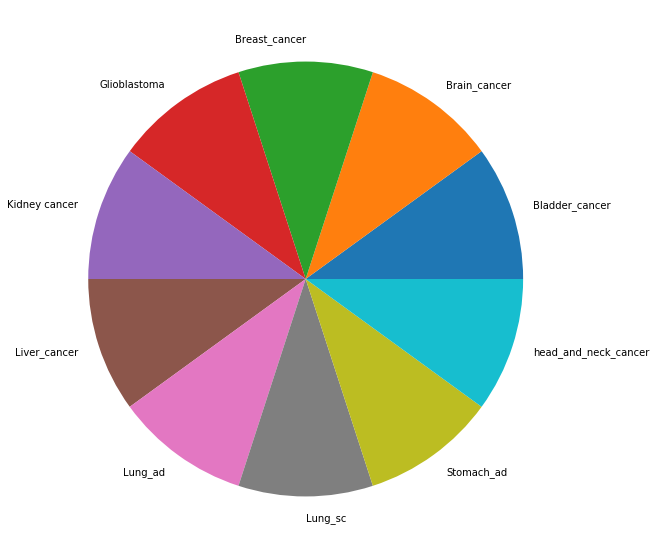

In [20]:
plt.figure(figsize=(10,10))
plt.pie([len(Bladder_cancer), len(Brain_cancer), len(Breast_cancer), len(Glioblastoma),
        len(Kidney_cancer), len(Liver_cancer), len(Lung_ad), len(Lung_sc), len(Stomach_ad), len(head_and_neck_cancer)], 
        labels=['Bladder_cancer', 'Brain_cancer', 'Breast_cancer', 'Glioblastoma', 
                'Kidney cancer', 'Liver_cancer', 'Lung_ad', 'Lung_sc', 'Stomach_ad', 'head_and_neck_cancer'])

# Cancer Markers Expression

In [2]:
Cancer_markers = pd.read_csv('Cancer_markers.csv')

In [3]:
Cancer_markers.head()

,Disease,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28,Unnamed: 29,A1BG,A1CF,A2BP1,A2LD1,A2M,A2ML1,A4GALT,A4GNT,AAA1,AAAS,AACS,AACSL,AADAC,AADACL2,AADACL3,AADACL4,AADAT,AAGAB,AAK1,AAMP,AANAT,AARS,AARS2,AARSD1,AASDH,AASDHPPT,AASS,AATF,AATK,ABAT,ABCA10,ABCA1,ABCA11P,ABCA12,ABCA13,ABCA17P,ABCA2,ABCA3,ABCA4,ABCA5,ABCA6,ABCA7,ABCA8,ABCA9,ABCB10,ABCB11,ABCB1,ABCB4,ABCB5,ABCB6,ABCB7,ABCB8,ABCB9,ABCC10,ABCC11,ABCC12,ABCC13,ABCC1,ABCC2,ABCC3,ABCC4,ABCC5,ABCC6,ABCC6P1,ABCC6P2,ABCC8,ABCC9,ABCD1,ABCD2,ABCD3,ABCD4,ABCE1,ABCF1,ABCF2,ABCF3,ABCG1,ABCG2,ABCG4,ABCG5,ABCG8,ABHD10,ABHD11,ABHD12,ABHD12B,ABHD13,ABHD14A,ABHD14B,ABHD15,ABHD1,ABHD2,ABHD3,ABHD4,ABHD5,ABHD6,ABHD8,ABI1,ABI2,ABI3,ABI3BP,ABL1,ABL2,ABLIM1,ABLIM2,ABLIM3,ABO,ABP1,ABR,ABRA,ABT1,ABTB1,ABTB2,ACAA1,ACAA2,ACACA,ACACB,ACAD10,ACAD11,ACAD8,ACAD9,ACADL,ACADM,ACADS,ACADSB,ACADVL,ACAN,ACAP1,ACAP2,ACAP3,ACAT1,ACAT2,ACBD3,ACBD4,ACBD5,ACBD6,ACBD7,ACCN1,ACCN2,ACCN3,ACCN4,ACCN5,ACCS,ACCSL,ACD,ACE,ACE2,ACER1,ACER2,ACER3,ACHE,ACIN1,ACLY,ACMSD,ACN9,ACO1,ACO2,ACOT11,ACOT12,ACOT13,ACOT1,ACOT2,ACOT4,ACOT6,ACOT7,ACOT8,ACOT9,ACOX1,ACOX2,ACOX3,ACOXL,ACP1,ACP2,ACP5,ACP6,ACPL2,ACPP,ACPT,ACR,ACRBP,ACRC,ACRV1,ACSBG1,ACSBG2,ACSF2,ACSF3,ACSL1,ACSL3,ACSL4,ACSL5,ACSL6,ACSM1,ACSM2A,ACSM2B,ACSM3,ACSM4,ACSM5,ACSS1,ACSS2,ACSS3,ACTA1,ACTA2,ACTB,ACTBL2,ACTC1,ACTG1,ACTG2,ACTL6A,ACTL6B,ACTL7A,ACTL7B,ACTL8,ACTL9,ACTN1,ACTN2,ACTN3,ACTN4,ACTR10,ACTR1A,ACTR1B,ACTR2,ACTR3,ACTR3B,ACTR3C,ACTR5,ACTR6,ACTR8,ACTRT1,ACTRT2,ACVR1,ACVR1B,ACVR1C,ACVR2A,ACVR2B,ACVRL1,ACY1,ACY3,ACYP1,ACYP2,ADA,ADAD1,ADAD2,ADAL,ADAM10,ADAM11,ADAM12,ADAM15,ADAM17,ADAM18,ADAM19,ADAM20,ADAM21,ADAM21P1,ADAM2,ADAM22,ADAM23,ADAM28,ADAM29,ADAM30,ADAM32,ADAM33,ADAM3A,ADAM5P,ADAM6,ADAM7,ADAM8,ADAM9,ADAMDEC1,ADAMTS10,ADAMTS12,ADAMTS13,ADAMTS14,ADAMTS15,ADAMTS16,ADAMTS17,ADAMTS18,ADAMTS19,ADAMTS1,ADAMTS20,ADAMTS2,ADAMTS3,ADAMTS4,ADAMTS5,ADAMTS6,ADAMTS7,ADAMTS8,ADAMTS9,ADAMTSL1,ADAMTSL2,ADAMTSL3,ADAMTSL4,ADAMTSL5,ADAP1,ADAP2,ADAR,ADARB1,ADARB2,ADAT1,ADAT2,ADAT3,ADC,ADCK1,ADCK2,ADCK4,ADCK5,ADCY10,ADCY1,ADCY2,ADCY3,ADCY4,ADCY5,ADCY6,ADCY7,ADCY8,ADCY9,ADCYAP1,ADCYAP1R1,ADD1,ADD2,ADD3,ADH1A,ADH1B,ADH1C,ADH4,ADH5,ADH6,ADH7,ADHFE1,ADI1,ADIG,ADIPOQ,ADIPOR1,ADIPOR2,ADK,ADM,ADM2,ADNP2,ADNP,ADO,ADORA1,ADORA2A,ADORA2B,ADORA3,ADPGK,ADPRH,ADPRHL1,ADPRHL2,ADRA1A,ADRA1B,ADRA1D,ADRA2A,ADRA2B,ADRA2C,ADRB1,ADRB2,ADRB3,ADRBK1,ADRBK2,ADRM1,ADSL,ADSS,ADSSL1,AEBP1,AEBP2,AEN,AES,AFAP1,AFAP1L1,AFAP1L2,AFARP1,AFF1,AFF2,AFF3,AFF4,AFG3L1,AFG3L2,AFM,AFMID,AFP,AFTPH,AG2,AGA,AGAP11,AGAP1,AGAP2,AGAP3,AGAP4,AGAP5,AGAP6,AGAP7,AGAP8,AGBL1,AGBL2,AGBL3,AGBL4,AGBL5,AGER,AGFG1,AGFG2,AGGF1,AGK,AGL,AGMAT,AGPAT1,AGPAT2,AGPAT3,AGPAT4,AGPAT5,AGPAT6,AGPAT9,AGPHD1,AGPS,AGR2,AGR3,AGRN,AGRP,AGT,AGTPBP1,AGTR1,AGTR2,AGTRAP,AGXT,AGXT2,AGXT2L1,AGXT2L2,AHCTF1,AHCY,AHCYL1,AHCYL2,AHDC1,AHI1,AHNAK2,AHNAK,AHR,AHRR,AHSA1,AHSA2,AHSG,AHSP,AICDA,AIDA,AIF1,AIF1L,AIFM1,AIFM2,AIFM3,AIG1,AIM1,AIM1L,AIM2,AIMP1,AIMP2,AIP,AIPL1,AIRE,AJAP1,AK1,AK2,AK3,AK3L1,AK5,AK7,AKAP10,AKAP11,AKAP12,AKAP13,AKAP14,AKAP1,AKAP2,AKAP3,AKAP4,AKAP5,...,ZNF233,ZNF234,ZNF235,ZNF236,ZNF23,ZNF238,ZNF239,ZNF24,ZNF248,ZNF250,ZNF251,ZNF25,ZNF252,ZNF253,ZNF254,ZNF256,ZNF257,ZNF259,ZNF260,ZNF263,ZNF264,ZNF266,ZNF267,ZNF26,ZNF268,ZNF271,ZNF273,ZNF274,ZNF275,ZNF2,ZNF276,ZNF277,ZNF280A,ZNF280B,ZNF280C,ZNF280D,ZNF281,ZNF282,ZNF283,ZNF284,ZNF285,ZNF286A,ZNF286B,ZNF287,ZNF28,ZNF292,ZNF295,ZNF296,ZNF300,ZNF302,ZNF304,ZNF30,ZNF311,ZNF317,ZNF318,ZNF319,ZNF320,ZNF321,ZNF322A,ZNF322B,ZNF323,ZNF324,ZNF324B,ZNF326,ZNF32,ZNF329,ZNF330,ZNF331,ZNF333,ZNF334,ZNF335,ZNF337,ZNF33A,ZNF33B,ZNF341,ZNF343,ZNF345,ZNF346,ZNF347,ZNF34,ZNF350,ZNF354A,ZNF354B,ZNF354C,ZNF35,ZNF358,ZNF362,ZNF365,ZNF366,ZNF367,ZNF3,ZNF37A,ZNF37B,ZNF382,ZNF383,ZNF384,ZNF385A,ZNF385B,ZNF385D,ZNF389,ZNF391,ZNF394,ZNF395,ZNF396,ZNF

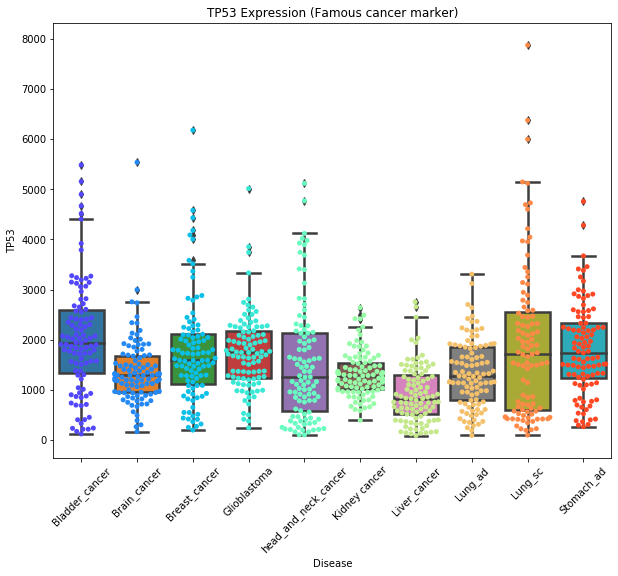

In [4]:
plt.figure(figsize=(10,8))
TP53 = sns.boxplot(x='Disease', y='TP53', data=Cancer_markers, linewidth=2.5).set_title('TP53 Expression (Famous cancer marker)')
TP53 = sns.swarmplot(x='Disease', y='TP53', data=Cancer_markers, palette='rainbow')
for xlabel in TP53.get_xticklabels():
    xlabel.set_rotation(45)

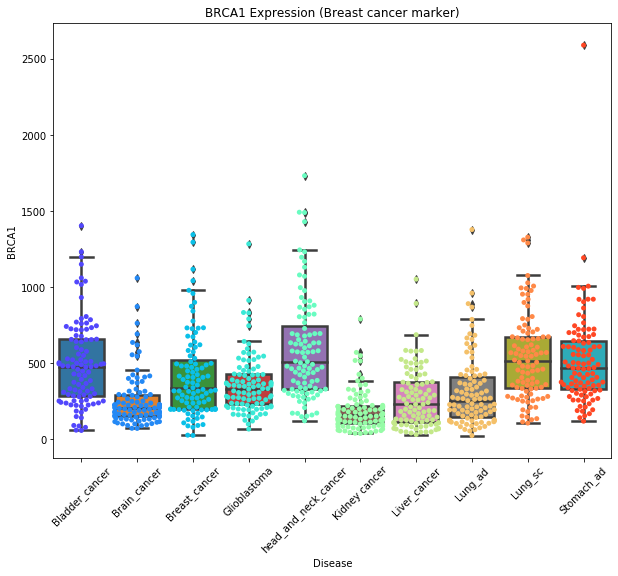

In [48]:
plt.figure(figsize=(10,8))
BRCA1 = sns.boxplot(x='Disease', y='BRCA1', data=Cancer_markers, linewidth=2.5).set_title('BRCA1 Expression (Breast cancer marker)')
BRCA1 = sns.swarmplot(x='Disease', y='BRCA1', data=Cancer_markers, palette='rainbow')
for xlabel in BRCA1.get_xticklabels():
    xlabel.set_rotation(45)

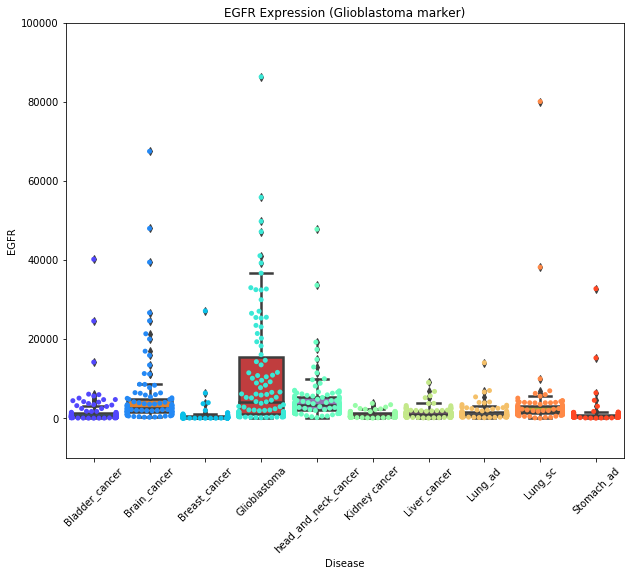

In [60]:
plt.figure(figsize=(10,8))
EGFR = sns.boxplot(x='Disease', y='EGFR', data=Cancer_markers, linewidth=2.5).set_title('EGFR Expression (Glioblastoma marker)')
EGFR = sns.swarmplot(x='Disease', y='EGFR', data=Cancer_markers, palette='rainbow')
EGFR.set_ylim(-10000, 100000)
for xlabel in EGFR.get_xticklabels():
    xlabel.set_rotation(45)

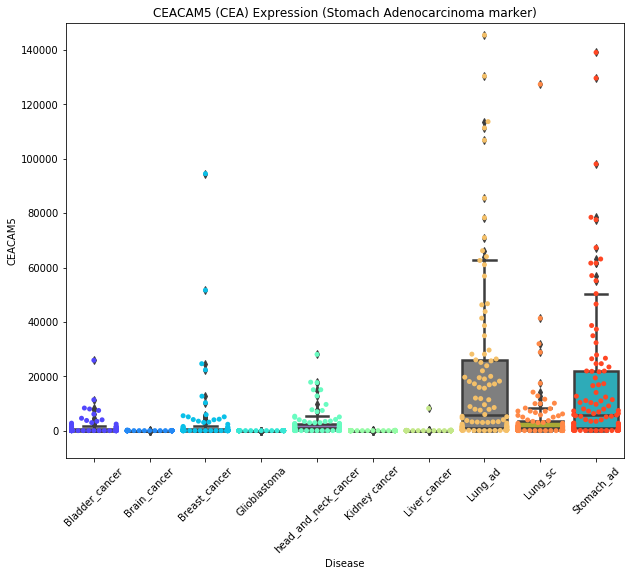

In [64]:
plt.figure(figsize=(10,8))
CEACAM5 = sns.boxplot(x='Disease', y='CEACAM5', data=Cancer_markers, linewidth=2.5).set_title('CEACAM5 (CEA) Expression (Stomach Adenocarcinoma marker)')
CEACAM5 = sns.swarmplot(x='Disease', y='CEACAM5', data=Cancer_markers, palette='rainbow')
CEACAM5.set_ylim(-10000, 150000)
for xlabel in CEACAM5.get_xticklabels():
    xlabel.set_rotation(45)

# train_test_split

In [24]:
# no need train_test_split

# from sklearn.model_selection import train_test_split

In [31]:
X = df.iloc[:, 1:].astype(float)
y = df['Disease']

In [32]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

# Scaling

In [228]:
# no need Scaling

In [229]:
# from sklearn.preprocessing import MinMaxScaler

# scaler=MinMaxScaler()

In [ ]:
# X_train=scaler.fit_transform(X_train)
# X_train=scaler.fit_transform(X_train)

# Logistic Regression

In [33]:
from sklearn.metrics import classification_report, confusion_matrix

In [34]:
from sklearn.linear_model import LogisticRegression

In [35]:
lr = LogisticRegression()

In [36]:
lr.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [37]:
print('Logistic Regression accuracy: {:.2f}%'.format(lr.score(X_test, y_test)*100))

Logistic Regression accuracy: 93.94%


In [38]:
lr.score(X_test, y_test)

0.9393939393939394

In [39]:
lr_predictions = lr.predict(X_test)

In [40]:
print(classification_report(y_test, lr_predictions))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94        15
           1       0.96      0.96      0.96        26
           2       0.94      1.00      0.97        17
           3       0.95      0.95      0.95        19
           4       1.00      1.00      1.00        15
           5       1.00      0.96      0.98        26
           6       0.89      0.94      0.92        18
           7       0.91      0.80      0.85        25
           8       0.90      1.00      0.95        18
           9       0.94      0.84      0.89        19

    accuracy                           0.94       198
   macro avg       0.94      0.95      0.94       198
weighted avg       0.94      0.94      0.94       198



# KNN model

In [41]:
from sklearn.neighbors import KNeighborsClassifier

In [42]:
knn=KNeighborsClassifier(n_neighbors=10)

In [43]:
knn.fit(X_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=10, p=2,
                     weights='uniform')

In [44]:
print('KNN accuracy: {:.2f}%'.format(knn.score(X_test, y_test)*100))

KNN accuracy: 83.84%


# Decision Tree

In [45]:
from sklearn.tree import DecisionTreeClassifier

In [46]:
decision_tree = DecisionTreeClassifier() 
decision_tree.fit(X_train, y_train)  
Y_pred = decision_tree.predict(X_test)  
acc_decision_tree = round(decision_tree.score(X_test, y_test) * 100, 2)
acc_decision_tree

92.93

In [47]:
print('Decision Tree accuracy: {:.2f}%'.format(decision_tree.score(X_test, y_test)*100))

Decision Tree accuracy: 92.93%


# RandomForest

In [48]:
from sklearn.ensemble import RandomForestClassifier

In [49]:
random_forest = RandomForestClassifier(n_estimators=100)
random_forest.fit(X_train, y_train)

y_prediction = random_forest.predict(X_test)

random_forest.score(X_train, y_train)
acc_random_forest = round(random_forest.score(X_test, y_test) * 100, 2)
acc_random_forest 

97.98

# SGDClassifier

In [50]:
from sklearn.linear_model import SGDClassifier

In [51]:
sgd = SGDClassifier(max_iter=5, tol=None)
sgd.fit(X_train, y_train)

y_pred = sgd.predict(X_test)

sgd.score(X_train, y_train)

acc_sgd = round(sgd.score(X_test, y_test) * 100, 2)
acc_sgd

88.89

# Perceptron

In [52]:
from sklearn.linear_model import Perceptron

In [53]:
perceptron = Perceptron(max_iter=5)
perceptron.fit(X_train, y_train)

y_pred = perceptron.predict(X_test)

acc_perceptron = round(perceptron.score(X_test, y_test) * 100, 2)
acc_perceptron

88.38

# Support Vector & LinearSVC

In [54]:
from sklearn.svm import SVC, LinearSVC

In [55]:
svm = SVC(random_state = 10)
svm.fit(X_train, y_train)
svm.score(X_test, y_test)
print('SVC accuracy: {:.2f}%'.format(svm.score(X_test, y_test)*100))

SVC accuracy: 7.58%


In [56]:
linear_svc = LinearSVC()
linear_svc.fit(X_train, y_train)

y_pred = linear_svc.predict(X_test)

acc_linear_svc = round(linear_svc.score(X_test, y_test) * 100, 2)
acc_linear_svc

93.43

# Naive Bayes - GaussianNB

In [57]:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
nb.fit(X_train, y_train)
print('NB accuracy: {:.2f}%'.format(nb.score(X_test, y_test)*100))

NB accuracy: 91.41%


# XG boost

In [58]:
import xgboost
xg = xgboost.XGBClassifier()
xg.fit(X_train, y_train)
print('XGboost accuracy: {:.2f}%'.format(xg.score(X_test, y_test)*100))

XGboost accuracy: 97.98%


In [59]:
from xgboost import XGBClassifier
xg = XGBClassifier()
xg.fit(X_train, y_train)
print(xg)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)


In [63]:
xg_pred = xg.predict(X_test)
xg_pred

array([0, 7, 9, 5, 6, 3, 6, 7, 9, 3, 1, 1, 7, 7, 8, 6, 8, 5, 8, 1, 1, 6,
       9, 4, 8, 0, 5, 3, 5, 1, 7, 7, 3, 6, 8, 0, 2, 1, 7, 7, 4, 6, 0, 5,
       5, 8, 2, 6, 2, 4, 1, 1, 3, 9, 5, 0, 4, 1, 4, 6, 7, 7, 6, 1, 4, 5,
       3, 9, 7, 5, 4, 8, 9, 5, 3, 7, 1, 4, 6, 1, 8, 0, 2, 2, 6, 0, 5, 3,
       5, 7, 9, 2, 0, 5, 1, 5, 1, 9, 7, 2, 2, 2, 6, 9, 6, 9, 9, 8, 7, 3,
       1, 8, 8, 3, 7, 3, 9, 3, 1, 4, 4, 0, 1, 6, 4, 3, 1, 7, 8, 6, 7, 0,
       9, 1, 5, 3, 8, 7, 5, 5, 5, 2, 2, 4, 5, 6, 0, 1, 8, 7, 9, 7, 7, 9,
       9, 8, 4, 5, 1, 6, 5, 2, 5, 0, 3, 7, 5, 8, 2, 3, 4, 5, 8, 3, 2, 1,
       7, 1, 8, 2, 4, 9, 0, 3, 3, 6, 5, 5, 1, 9, 9, 6, 9, 2, 1, 1, 2, 0])

In [62]:
predictions = [round(value) for value in xg_pred]
predictions

[0,
 7,
 9,
 5,
 6,
 3,
 6,
 7,
 9,
 3,
 1,
 1,
 7,
 7,
 8,
 6,
 8,
 5,
 8,
 1,
 1,
 6,
 9,
 4,
 8,
 0,
 5,
 3,
 5,
 1,
 7,
 7,
 3,
 6,
 8,
 0,
 2,
 1,
 7,
 7,
 4,
 6,
 0,
 5,
 5,
 8,
 2,
 6,
 2,
 4,
 1,
 1,
 3,
 9,
 5,
 0,
 4,
 1,
 4,
 6,
 7,
 7,
 6,
 1,
 4,
 5,
 3,
 9,
 7,
 5,
 4,
 8,
 9,
 5,
 3,
 7,
 1,
 4,
 6,
 1,
 8,
 0,
 2,
 2,
 6,
 0,
 5,
 3,
 5,
 7,
 9,
 2,
 0,
 5,
 1,
 5,
 1,
 9,
 7,
 2,
 2,
 2,
 6,
 9,
 6,
 9,
 9,
 8,
 7,
 3,
 1,
 8,
 8,
 3,
 7,
 3,
 9,
 3,
 1,
 4,
 4,
 0,
 1,
 6,
 4,
 3,
 1,
 7,
 8,
 6,
 7,
 0,
 9,
 1,
 5,
 3,
 8,
 7,
 5,
 5,
 5,
 2,
 2,
 4,
 5,
 6,
 0,
 1,
 8,
 7,
 9,
 7,
 7,
 9,
 9,
 8,
 4,
 5,
 1,
 6,
 5,
 2,
 5,
 0,
 3,
 7,
 5,
 8,
 2,
 3,
 4,
 5,
 8,
 3,
 2,
 1,
 7,
 1,
 8,
 2,
 4,
 9,
 0,
 3,
 3,
 6,
 5,
 5,
 1,
 9,
 9,
 6,
 9,
 2,
 1,
 1,
 2,
 0]

In [66]:
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 97.98%


# ML Results

In [68]:
results = pd.DataFrame({
    'Model': ['Logistic Regression', 'KNN model','Decision Tree', 'random_forest', 
              'SGDClassifier', 'Perceptron', 'SVC', 'LinearSVC', 'Naive Bayes - GaussianNB', 'XG boost'],
    'Score': [lr.score(X_test, y_test), knn.score(X_test, y_test), decision_tree.score(X_test, y_test), 
              random_forest.score(X_test, y_test), sgd.score(X_test, y_test), perceptron.score(X_test, y_test), 
              svm.score(X_test, y_test), linear_svc.score(X_test, y_test), nb.score(X_test, y_test), xg.score(X_test, y_test)]})
result_df = results.sort_values(by='Score', ascending=False)
result_df = result_df.set_index('Score')
result_df

,Model
Score,
0.979798,random_forest
0.979798,XG boost
0.939394,Logistic Regression
0.934343,LinearSVC
0.929293,Decision Tree
0.914141,Naive Bayes - GaussianNB
0.888889,SGDClassifier
0.883838,Perceptron
0.838384,KNN model


# import test and answer data

In [89]:
test_df = pd.read_csv('Test_without_answer.csv', index_col = 0)

In [115]:
answer_df = pd.read_csv('Test_answer.csv', index_col = 0)

In [116]:
answer_df.iloc[:, 0] =  le.fit_transform(answer_df.values)

In [118]:
answer_df.head()

,Disease
TCGA-DK-A2I6-01,0
TCGA-DK-A3IK-01,0
TCGA-DK-A3IL-01,0
TCGA-DK-A3IM-01,0
TCGA-DK-A3IN-01,0


In [119]:
answer_df_result = list(le.inverse_transform([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, ]))
answer_df_result

['Bladder_cancer',
 'Brain_cancer',
 'Breast_cancer',
 'Glioblastoma',
 'Kidney cancer',
 'Liver_cancer',
 'Lung_ad',
 'Lung_sc',
 'Stomach_ad',
 'head_and_neck_cancer']

In [120]:
answer_encoding_result = pd.DataFrame({'Code':[0, 1, 2, 3, 4, 5, 6, 7, 8, 9], 'Disease':['Bladder_cancer',
 'Brain_cancer',
 'Breast_cancer',
 'Glioblastoma',
 'Kidney cancer',
 'Liver_cancer',
 'Lung_ad',
 'Lung_sc',
 'Stomach_ad',
 'head_and_neck_cancer']})
answer_encoding_result

,Code,Disease
0,0,Bladder_cancer
1,1,Brain_cancer
2,2,Breast_cancer
3,3,Glioblastoma
4,4,Kidney cancer
5,5,Liver_cancer
6,6,Lung_ad
7,7,Lung_sc
8,8,Stomach_ad
9,9,head_and_neck_cancer


In [91]:
test_df.head()

,100130426.0,100133144.0,100134869.0,10357.0,10431.0,136542.0,155060.0,26823.0,280660.0,317712.0,340602.0,388795.0,390284.0,391343.0,391714.0,404770.0,441362.0,442388.0,553137.0,57714.0,645851.0,652919.0,653553.0,728045.0,728603.0,728788.0,729884.0,8225.0,90288.0,1.0,29974.0,54715.0,87769.0,2.0,144568.0,53947.0,51146.0,404744.0,8086.0,65985.0,729522.0,13.0,344752.0,126767.0,343066.0,51166.0,79719.0,22848.0,14.0,15.0,16.0,57505.0,80755.0,132949.0,60496.0,10157.0,26574.0,9625.0,18.0,10349.0,19.0,79963.0,26154.0,154664.0,650655.0,20.0,21.0,24.0,23461.0,23460.0,10347.0,10351.0,10350.0,23456.0,8647.0,5243.0,5244.0,340273.0,10058.0,22.0,11194.0,23457.0,89845.0,85320.0,94160.0,150000.0,4363.0,1244.0,8714.0,10257.0,10057.0,368.0,653190.0,730013.0,6833.0,10060.0,215.0,225.0,5825.0,5826.0,6059.0,23.0,10061.0,55324.0,9619.0,9429.0,64137.0,64240.0,64241.0,55347.0,83451.0,26090.0,145447.0,84945.0,25864.0,84836.0,116236.0,84696.0,11057.0,171586.0,63874.0,51099.0,57406.0,79575.0,10006.0,10152.0,51225.0,25890.0,25.0,27.0,3983.0,84448.0,22885.0,28.0,26.0,29.0,137735.0,29777.0,80325.0,25841.0,30.0,10449.0,31.0,32.0,80724.0,84129.0,27034.0,28976.0,33.0,34.0,35.0,36.0,37.0,176.0,9744.0,23527.0,116983.0,38.0,39.0,64746.0,79777.0,91452.0,84320.0,414149.0,40.0,41.0,9311.0,55515.0,51802.0,84680.0,390110.0,65057.0,1636.0,59272.0,125981.0,340485.0,55331.0,43.0,22985.0,47.0,130013.0,57001.0,48.0,50.0,26027.0,134526.0,55856.0,641371.0,10965.0,122970.0,641372.0,11332.0,10005.0,23597.0,51.0,8309.0,8310.0,55289.0,52.0,53.0,54.0,51205.0,92370.0,55.0,93650.0,49.0,84519.0,93953.0,56.0,23205.0,81616.0,80221.0,197322.0,2180.0,2181.0,2182.0,51703.0,23305.0,116285.0,123876.0,348158.0,6296.0,341392.0,54988.0,84532.0,55902.0,79611.0,58.0,59.0,60.0,345651.0,70.0,71.0,72.0,86.0,51412.0,10881.0,10880.0,81569.0,284382.0,87.0,88.0,89.0,81.0,55860.0,10121.0,10120.0,10097.0,10096.0,57180.0,653857.0,79913.0,64431.0,93973.0,139741.0,140625.0,90.0,91.0,130399.0,92.0,93.0,94.0,95.0,91703.0,97.0,98.0,100.0,132612.0,161931.0,161823.0,102.0,4185.0,8038.0,8751.0,6868.0,8749.0,8728.0,8748.0,8747.0,145241.0,2515.0,53616.0,8745.0,10863.0,11086.0,11085.0,203102.0,80332.0,1587.0,255926.0,8755.0,8756.0,101.0,8754.0,27299.0,81794.0,81792.0,11093.0,140766.0,170689.0,170690.0,170691.0,170692.0,171019.0,9510.0,80070.0,9509.0,9508.0,9507.0,11096.0,11174.0,11173.0,11095.0,56999.0,92949.0,9719.0,57188.0,54507.0,339366.0,11033.0,55803.0,103.0,104.0,105.0,23536.0,134637.0,113179.0,113451.0,57143.0,90956.0,79934.0,203054.0,55811.0,107.0,108.0,109.0,196883.0,111.0,112.0,113.0,114.0,115.0,116.0,117.0,118.0,119.0,120.0,124.0,125.0,126.0,127.0,128.0,130.0,131.0,137872.0,55256.0,149685.0,9370.0,51094.0,79602.0,132.0,133.0,79924.0,22850.0,23394.0,84890.0,134.0,135.0,136.0,140.0,83440.0,141.0,113622.0,54936.0,148.0,147.0,146.0,150.0,151.0,152.0,153.0,154.0,155.0,156.0,157.0,11047.0,158.0,159.0,122622.0,165.0,121536.0,64782.0,166.0,60312.0,134265.0,84632.0,246182.0,4299.0,2334.0,3899.0,27125.0,172.0,10939.0,173.0,125061.0,174.0,54812.0,387763.0,175.0,119385.0,116987.0,116986.0,116988.0,119016.0,729092.0,414189.0,653268.0,728404.0,123624.0,79841.0,340351.0,84871.0,60509.0,177.0,3267.0,3268.0,55109.0,55750.0,178.0,79814.0,10554.0,10555.0,56894.0,56895.0,55326.0,137964.0,84803.0,123688.0,8540.0,10551.0,155465.0,375790.0,181.0,183.0,23287.0,185.0,186.0,57085.0,189.0,64902.0,64850.0,85007.0,25909.0,191.0,10768.0,23382.0,27245.0,54806.0,113146.0,79026.0,196.0,57491.0,10598.0,130872.0,197.0,51327.0,57379.0,64853.0,199.0,83543.0,9131.0,84883.0,150209.0,51390.0,202.0,55057.0,9447.0,9255.0,7965.0,9049.0,23746.0,326.0,55966.0,203.0,204.0,50808.0,205.0,26289.0,122481.0,11216.0,11215.0,9590.0,11214.0,158798.0,8165.0,11217.0,10566.0,8852.0,9495.0,9472.0,...,353355.0,10780.0,9310.0,7776.0,7571.0,10472.0,8187.0,7572.0,57209.0,58500.0,90987.0,219749.0,286101.0,56242.0,9534.0,10172.0,113835.0,8882.0,339324.0,10127.0,9422.0,10781.0,10308.0,7574.0,10795.0,10778.0,10793.0,10782.0,10838.0,7549.0,92822.0,11179.0,129025.0,14088

In [92]:
test_df.astype(float)

100130426.0  100133144.0  100134869.0     10357.0  \
TCGA-DK-A2I6-01       0.0000     1.839900     4.322500  229.713000   
TCGA-DK-A3IK-01       0.0000    28.198500    21.528200  116.146000   
TCGA-DK-A3IL-01       0.0000    10.059500     9.276200  112.112000   
TCGA-DK-A3IM-01       0.0000    12.944200     2.461500  111.284000   
TCGA-DK-A3IN-01       0.0000     5.121500     2.729000   83.304700   
TCGA-DK-A3IQ-01       0.0000     9.887200    11.651300   88.553800   
TCGA-DK-A3IS-01       0.0000    12.891700     8.509600  179.108000   
TCGA-DK-A3IT-01       0.0000     4.751600    13.387200  144.129000   
TCGA-DK-A3IU-01       0.0000     2.431700     2.185500  113.278000   
TCGA-DK-A3IV-01       0.0000    44.480200    24.573900   99.956600   
TCGA-DK-A3WW-01       0.0000     0.683100     5.483900  189.279000   
TCGA-DK-A3WX-01       0.0000     9.034100     4.041000  251.230000   
TCGA-DK-A3WY-01       0.0000     0.000000     0.856500  379.379000   
TCGA-DK-A3X1-01       0.0000     5.444100     6.903300  273.888000   
TCGA-DK-A3X2-01       0.0000    33.210400    13.949700  195.744000   
TCGA-DK-A6AV-01       0.0000     9.182500     9.195200  227.319000   
TCGA-DK-A6AW-01       0.0000     1.390200     4.576400  229.344000   
TCGA-DK-A6B0-01       0.0000     5.610900     9.345100  127.782000   
TCGA-DK-A6B1-01       0.0000    14.495700    13.247300  195.981000   
TCGA-DK-A6B2-01       0.0000     4.505900     3.450600  143.664000   
TCGA-DU-7009-01       0.0000    19.251800    22.515000  234.441000   
TCGA-DU-7010-01       0.0000     2.055500     2.766700  172.625000   
TCGA-DU-7011-01       0.0000     8.969000     9.097000  191.632000   
TCGA-DU-7012-01       0.0000     7.509100     5.775500  200.721000   
TCGA-DU-7013-01       0.0000    14.609300    10.103000  263.285000   
TCGA-DU-7014-01       0.0000     5.699700     1.662700  213.328000   
TCGA-DU-7015-01       0.0000     5.798000     4.566200  231.774000   
TCGA-DU-7018-01       0.0000    16.151300    32.300200  188.564000   
TCGA-DU-7019-01       0.0000     3.946800     4.040000  190.715000   
TCGA-DU-7290-01       0.0000    14.063900    13.664100  144.792000   
TCGA-DU-7292-01       0.0000     0.654700     7.010500  106.381000   
TCGA-DU-7294-01       0.0000     7.331500    26.862200  197.315000   
TCGA-DU-7298-01       0.0000     5.029500    18.878900  190.434000   
TCGA-DU-7299-01       0.0000     2.149900     5.346700  192.252000   
TCGA-DU-7300-01       0.0000     4.586700    16.262100  147.752000   
TCGA-DU-7301-01       0.0000     2.047200     4.545500  132.384000   
TCGA-DU-7302-01       0.0000     7.788000    30.726000  164.836000   
TCGA-DU-7304-01       0.0000    12.400400    14.036000  153.042000   
TCGA-DU-7306-01       0.0000    11.595700    15.673400  158.240000   
TCGA-DU-7309-01       0.0000     5.247700     9.643900  145.002000   
TCGA-A2-A25D-01       0.0000     0.925400     2.882700  100.861000   
TCGA-A2-A25E-01       0.0000    11.562900    11.078600   71.701300   
TCGA-A2-A25F-01       0.0000     2.652600     3.785700   96.585100   
TCGA-A2-A3KC-01       0.0000     9.515400    22.794200   92.171100   
TCGA-A2-A3KD-01       0.0000     7.604600    10.480400   80.241300   
TCGA-A2-A3XS-01       0.0000    16.766300    32.150400  212.439000   
TCGA-A2-A3XT-01       0.0000    20.108200    18.664700  155.500000   
TCGA-A2-A3XU-01       0.0000     1.325200     1.452100  123.951000   
TCGA-A2-A3XV-01       0.0000     0.000000     3.871000   91.815100   
TCGA-A2-A3XW-01       0.0000     1.098500    14.138900   54.588900   
TCGA-A2-A3XX-01       0.0000     3.653500     6.971100  203.873000   
TCGA-A2-A3XY-01       0.0000     9.688400    24.273700  213.727000   
TCGA-A2-A3XZ-01       0.0000     4.369400    20.096500  165.121000   
TCGA-A2-A3Y0-01       0.0000     3.700500     1.881500  277.442000   
TCGA-A2-A4RW-01       0.0000    15.363200    10.665900  128.372000   
TCGA-A2-A4RX-01       0.0000    10.800300    25.746700  157.202000   
TCGA-A2-A4RY-01       0.000

In [108]:
test_df.shape

(200, 20531)

# Diagnose real data

# Logistic Regression

In [123]:
Logistic_regression_prediction = lr.predict(test_df)
Logistic_regression_prediction

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 9, 2, 2, 2, 2, 2, 2, 2, 2, 9, 2, 3, 1, 1, 3, 1, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 9, 9, 9, 9, 9, 9, 9, 9,
       9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 8, 6, 6, 6, 6, 6,
       6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 4, 8, 7, 7, 6, 7, 7, 0, 7, 6, 7,
       7, 7, 7, 7, 8, 8, 8, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8])

In [151]:
Logistic_regression_accuracy = accuracy_score(answer_df, Logistic_regression_prediction)
print("Logistic_regression Accuracy: %.2f%%" % (Logistic_regression_accuracy * 100.0))

Logistic_regression Accuracy: 93.00%


# KNN model

In [125]:
KNN_prediction = knn.predict(test_df)
KNN_prediction

array([0, 0, 0, 9, 2, 9, 0, 0, 0, 0, 9, 9, 8, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 9, 2, 2, 2, 7, 2, 2, 2, 2, 9, 2, 3, 1, 1, 3, 1, 3,
       3, 3, 3, 3, 3, 3, 1, 3, 3, 3, 1, 3, 3, 3, 2, 7, 9, 7, 9, 7, 9, 9,
       9, 7, 9, 7, 9, 9, 7, 9, 9, 7, 9, 9, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 4, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 8, 6, 6,
       6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 6, 2, 6, 7, 7, 8, 8, 6, 7, 7, 6, 7,
       7, 7, 6, 7, 8, 8, 8, 9, 2, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8])

In [150]:
KNN_prediction_accuracy = accuracy_score(answer_df, KNN_prediction)
print("KNN Accuracy: %.2f%%" % (KNN_prediction_accuracy * 100.0))

KNN Accuracy: 83.00%


# Decision Tree

In [129]:
Decision_tree_prediction = decision_tree.predict(test_df)
Decision_tree_prediction

array([7, 0, 0, 0, 0, 8, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 8, 9, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 9, 9, 9, 9, 9, 9, 9, 9,
       9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 8, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 0, 6, 6,
       6, 6, 6, 6, 6, 6, 7, 7, 0, 7, 7, 1, 5, 6, 7, 7, 6, 6, 8, 7, 6, 0,
       7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8])

In [149]:
Decision_tree_accuracy = accuracy_score(answer_df, Decision_tree_prediction)
print("Decision_tree Accuracy: %.2f%%" % (Decision_tree_accuracy * 100.0))

Decision_tree Accuracy: 90.00%


# Random forest

In [109]:
Random_forest_prediction = random_forest.predict(test_df)
Random_forest_prediction

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 9, 9, 9, 9, 9, 9, 9, 9,
       9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 0, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 0, 6, 6,
       6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 2, 5, 7, 7, 7, 6, 6, 0, 7, 6, 7,
       7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8])

In [148]:
Random_forest_accuracy = accuracy_score(answer_df, Random_forest_prediction)
print("Random_forest Accuracy: %.2f%%" % (Random_forest_accuracy * 100.0))

Random_forest Accuracy: 95.00%


# SGDClassifier¶

In [132]:
SGDClassifier_prediction = sgd.predict(test_df)
SGDClassifier_prediction

array([0, 0, 0, 9, 0, 9, 0, 0, 0, 0, 0, 9, 2, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 9, 2, 2, 2, 2, 2, 9, 2, 2, 9, 2, 3, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 3, 3, 1, 3, 1, 1, 1, 3, 3, 3, 9, 7, 9, 9, 9, 9, 9, 9,
       9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 7, 6, 6, 6, 6, 6,
       6, 6, 6, 7, 6, 6, 7, 0, 7, 7, 6, 4, 7, 7, 7, 6, 7, 7, 7, 7, 6, 7,
       7, 7, 7, 9, 8, 8, 8, 9, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8])

In [147]:
SGDClassifier_accuracy = accuracy_score(answer_df, SGDClassifier_prediction)
print("SGD Classifier Accuracy: %.2f%%" % (SGDClassifier_accuracy * 100.0))

SGD Classifier Accuracy: 84.50%


# Perceptron

In [135]:
Perceptron_prediction = perceptron.predict(test_df)
Perceptron_prediction

array([0, 0, 0, 9, 6, 6, 0, 0, 5, 9, 9, 9, 2, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 8, 2,
       2, 2, 2, 2, 2, 9, 2, 2, 2, 2, 2, 9, 2, 2, 6, 2, 3, 1, 1, 3, 1, 3,
       3, 3, 3, 1, 3, 3, 1, 3, 3, 3, 3, 3, 3, 3, 9, 7, 9, 9, 9, 9, 9, 9,
       9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 8, 6, 6, 6, 6, 6,
       6, 6, 6, 6, 6, 6, 7, 0, 7, 7, 7, 3, 7, 7, 7, 3, 7, 7, 9, 7, 6, 7,
       7, 7, 7, 9, 8, 8, 8, 9, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8])

In [146]:
Perceptron_accuracy = accuracy_score(answer_df, Perceptron_prediction)
print("Perceptron Accuracy: %.2f%%" % (Perceptron_accuracy * 100.0))

Perceptron Accuracy: 86.50%


# Support vector machine

In [139]:
SVM_prediction = svm.predict(test_df)
SVM_prediction

array([4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4])

In [145]:
SVM_accuracy = accuracy_score(answer_df, SVM_prediction)
print("SVM Accuracy: %.2f%%" % (SVM_accuracy * 100.0))

SVM Accuracy: 10.00%


# LinearSVC

In [142]:
LinearSVC_prediction = linear_svc.predict(test_df)
LinearSVC_prediction

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 9, 2, 2, 2, 2, 2, 2, 2, 6, 9, 2, 3, 1, 1, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 9, 9, 9, 9, 9, 9, 9, 9,
       9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 0, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 8, 6, 6, 7, 7, 6,
       6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 4, 8, 7, 7, 6, 7, 7, 0, 7, 6, 7,
       7, 7, 7, 7, 8, 8, 8, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8])

In [144]:
LinearSVC_accuracy = accuracy_score(answer_df, LinearSVC_prediction)
print("LinearSVC Accuracy: %.2f%%" % (LinearSVC_accuracy * 100.0))

LinearSVC Accuracy: 92.00%


# Naive Bayes - GaussianNB

In [152]:
Naive_bayes_prediction = nb.predict(test_df)
Naive_bayes_prediction

array([0, 0, 0, 9, 0, 0, 0, 0, 0, 0, 9, 0, 8, 0, 7, 0, 0, 0, 0, 0, 1, 1,
       1, 3, 3, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 0, 2, 2, 7, 7, 2, 2, 2, 2, 6, 2, 3, 3, 1, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 9, 7, 9, 9, 9, 7, 9, 9,
       9, 9, 9, 7, 9, 9, 7, 9, 9, 9, 7, 9, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
       6, 6, 6, 7, 6, 6, 7, 7, 7, 9, 6, 8, 5, 7, 7, 7, 7, 6, 0, 7, 6, 7,
       7, 7, 6, 7, 8, 8, 8, 9, 8, 8, 8, 6, 8, 6, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8])

In [153]:
Naive_bayes_accuracy = accuracy_score(answer_df, Naive_bayes_prediction)
print("Naive_bayes Accuracy: %.2f%%" % (Naive_bayes_accuracy * 100.0))

Naive_bayes Accuracy: 85.50%


# XG boost

In [160]:
XG_boost_prediction = nb.predict(test_df)
XG_boost_prediction

array([0, 0, 0, 9, 0, 0, 0, 0, 0, 0, 9, 0, 8, 0, 7, 0, 0, 0, 0, 0, 1, 1,
       1, 3, 3, 1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 0, 2, 2, 7, 7, 2, 2, 2, 2, 6, 2, 3, 3, 1, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 9, 7, 9, 9, 9, 7, 9, 9,
       9, 9, 9, 7, 9, 9, 7, 9, 9, 9, 7, 9, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
       6, 6, 6, 7, 6, 6, 7, 7, 7, 9, 6, 8, 5, 7, 7, 7, 7, 6, 0, 7, 6, 7,
       7, 7, 6, 7, 8, 8, 8, 9, 8, 8, 8, 6, 8, 6, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8])

In [161]:
XG_boost_accuracy = accuracy_score(answer_df, XG_boost_prediction)
print("XG_boost_ Accuracy: %.2f%%" % (XG_boost_accuracy * 100.0))

XG_boost_ Accuracy: 85.50%


# Summary

In [159]:
Real_data_results = pd.DataFrame({
    'Model': ['Logistic Regression', 'KNN model','Decision Tree', 'random_forest', 
              'SGDClassifier', 'Perceptron', 'SVC', 'LinearSVC', 'Naive Bayes - GaussianNB', 'XG boost'],
    'Test_Score': [lr.score(X_test, y_test), knn.score(X_test, y_test), decision_tree.score(X_test, y_test), 
              random_forest.score(X_test, y_test), sgd.score(X_test, y_test), perceptron.score(X_test, y_test), 
              svm.score(X_test, y_test), linear_svc.score(X_test, y_test), nb.score(X_test, y_test), xg.score(X_test, y_test)],
    'Real_score': [Logistic_regression_accuracy, KNN_prediction_accuracy, Decision_tree_accuracy, 
                  Random_forest_accuracy, SGDClassifier_accuracy, Perceptron_accuracy, 
                  SVM_accuracy, LinearSVC_accuracy, Naive_bayes_accuracy, Naive_bayes_accuracy]})
Real_data_result_df = Real_data_results.sort_values(by='Test_Score', ascending=False)
Real_data_result_df = Real_data_result_df.set_index('Model')
Real_data_result_df

,Test_Score,Real_score
Model,,
random_forest,0.979798,0.950
XG boost,0.979798,0.855
Logistic Regression,0.939394,0.930
LinearSVC,0.934343,0.920
Decision Tree,0.929293,0.900
Naive Bayes - GaussianNB,0.914141,0.855
SGDClassifier,0.888889,0.845
Perceptron,0.883838,0.865
KNN model,0.838384,0.830


# Random forest is the BEST !!!